In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0302_MR1_mpr-3_154.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0114_MR1_mpr-1_130.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0150_MR1_mpr-3_129.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0253_MR1_mpr-3_113.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0349_MR1_mpr-4_150.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0045_MR1_mpr-2_102.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0209_MR1_mpr-4_128.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0074_MR1_mpr-4_140.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0330_MR1_mpr-4_112.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0234_MR1_mpr-4_113.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0065_MR1_mpr-3_131.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0207_MR1_mpr-2_106.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0375_MR1_mpr-1_136.jpg
/kaggle/input/imagesoasis/Data/Non Demented/OAS1_0160_MR1_mpr-4_

In [3]:
# Importing packages 

import numpy as np
import pandas as pd
import keras
import matplotlib.pyplot as plt
import re
import os
import random
import tensorflow as tf
import plotly.express as px

from keras.models import Sequential
from PIL import Image
from keras.layers import Conv2D,Flatten,Dense,Dropout,BatchNormalization,MaxPooling2D
from sklearn.preprocessing import OneHotEncoder, label_binarize
from sklearn.model_selection import train_test_split
from sklearn.metrics import auc, average_precision_score, confusion_matrix, roc_auc_score, f1_score, confusion_matrix, precision_recall_fscore_support
from tensorflow.keras.applications import EfficientNetB0, EfficientNetV2B1
from tensorflow.keras import layers, models
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import clone_model
from matplotlib.colors import LogNorm, LinearSegmentedColormap
from PIL import Image
from scipy.stats import skew
from tqdm import tqdm

2025-09-13 17:42:08.453591: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1757785328.641451      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1757785328.697874      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [4]:
# Downloading files

# Four categories 
non_demented = []
very_mild_demented = []
mild_demented = []
moderate_demented = []

# Download per category
for dirname, _, filenames in os.walk('/kaggle/input/imagesoasis/Data/Non Demented'):
    for filename in filenames:
        non_demented.append(os.path.join(dirname, filename))
        
for dirname, _, filenames in os.walk('/kaggle/input/imagesoasis/Data/Very mild Dementia'):
    for filename in filenames:
        very_mild_demented.append(os.path.join(dirname, filename))
        
for dirname, _, filenames in os.walk('/kaggle/input/imagesoasis/Data/Mild Dementia'):
    for filename in filenames:
        mild_demented.append(os.path.join(dirname, filename))
        
for dirname, _, filenames in os.walk('/kaggle/input/imagesoasis/Data/Moderate Dementia'):
    for filename in filenames:
        moderate_demented.append(os.path.join(dirname, filename))

In [5]:
# How many samples in each category: 
print(len(non_demented))
print(len(very_mild_demented))
print(len(mild_demented))
print(len(moderate_demented))

67222
13725
5002
488


In [6]:
def get_info_from_filename(filename):
    pattern = re.compile('OAS1_(\d+)_MR(\d+)_mpr-(\d+)_(\d+).jpg')
    match = pattern.match(filename)
    patient_id = match.group(1)
    mr_id = match.group(2)
    scan_id = match.group(3)
    layer_id = match.group(4)

    return patient_id, mr_id, scan_id, layer_id

In [7]:
def create_ref_df(dataset_path):
    paths, labels = [], []
    patient_ids, mr_ids, scan_ids, layer_ids = [], [], [], []

    # Iterate through folders in the dataset_path
    for folder in os.listdir(dataset_path):
        
        # Iterate through files in each folder
        for file in os.listdir(os.path.join(dataset_path, folder)):

            # Extract information from the filename using get_info_from_filename function
            patient_id, mr_id, scan_id, layer_id = get_info_from_filename(file)

            # Append information to respective lists
            paths.append(os.path.join(dataset_path, folder, file))
            labels.append(folder)
            patient_ids.append(patient_id)
            mr_ids.append(mr_id)
            scan_ids.append(scan_id)
            layer_ids.append(layer_id)

    # Create a DataFrame from the collected information
    ref_df = pd.DataFrame({
        'path': paths,
        'label': labels,
        'patient_id': patient_ids,
        'mr_id': mr_ids,
        'scan_id': scan_ids,
        'layer_id': layer_ids
    })

    # Convert columns to appropriate data types
    ref_df = ref_df.astype({
        'path': 'string',
        'label': 'string',
        'patient_id': 'int64',
        'mr_id': 'int64',
        'scan_id': 'int64',
        'layer_id': 'int64'
    })

    return ref_df

In [8]:
# Applying the function defined above
ref_df = create_ref_df('/kaggle/input/imagesoasis/Data')

In [9]:
def load_images(ref_df):
    labels = []
    images = []
    paths = []

    # Iterate through rows of the reference DataFrame
    for idx, row in tqdm(ref_df.iterrows(), total=ref_df.shape[0]):
        
        # Load image using PIL and convert it to a grayscale numpy array
        images.append(np.array(Image.open(row['path']).convert('L')))
        
        # Append label and path to respective lists
        labels.append(row['label'])
        paths.append(row['path'])
    
    # Return lists of images, labels, and paths
    return images, labels, paths

In [10]:
# Applying the function defined above
images, labels, paths = load_images(ref_df)

100%|██████████| 86437/86437 [08:08<00:00, 176.97it/s]


In [11]:
def get_image_stats(images, labels, paths):
    means, stds, widths, heights = [], [], [], []
    skewnesses = []
    
    # Iterate through the images
    for image in tqdm(images):
        
        # Calculate mean and standard deviation
        means.append(np.mean(image))
        stds.append(np.std(image))
        
        # Get image width and height
        widths.append(image.shape[0])
        heights.append(image.shape[1])
        
        # Calculate skewness of the image histogram
        image_hist = np.histogram(image.flatten())[0]
        skewnesses.append(skew(image_hist))
    
    # Create a DataFrame with image statistics
    image_stats = pd.DataFrame({
        'mean': means,
        'std': stds,
        'width': widths,
        'height': heights,
        'skew': skewnesses
    })
    
    # Add labels and paths to the DataFrame
    image_stats['label'] = labels
    image_stats['path'] = paths
    
    return image_stats

In [12]:
# Applying the function defined above
image_stats = get_image_stats(images, labels, paths)

100%|██████████| 86437/86437 [05:18<00:00, 271.41it/s]


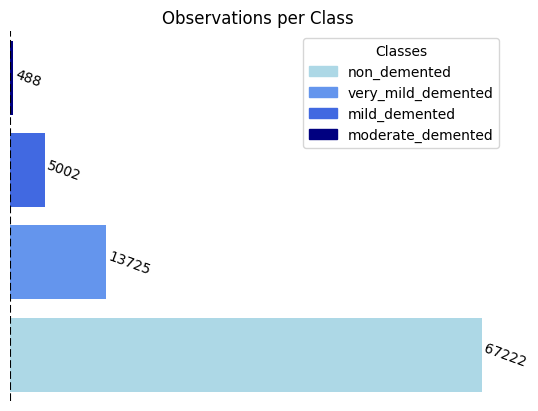

In [13]:
# Defining class_names, frequencies
frequencies = [len(non_demented),  len(very_mild_demented), len(moderate_demented), len(mild_demented),]
class_names = ["non_demented", "very_mild_demented", "moderate_demented", "mild_demented"]

# Sorting class_names and frequencies in descending order
sorted_indices = np.argsort(frequencies)[::-1]
class_names = np.array(class_names)[sorted_indices]
frequencies = np.array(frequencies)[sorted_indices]

# Navy blue gradient color palette with 4 distinct colors
navy_blue_palette = LinearSegmentedColormap.from_list("navy_blue_palette", ["lightblue", "cornflowerblue", "royalblue", "navy"], N=4)

# Bar plot with adjusted y-axis limits and navy blue gradient colors
fig, ax = plt.subplots()
bp = ax.barh(np.arange(len(class_names)), frequencies, color=navy_blue_palette(np.linspace(0, 1, len(class_names))))

# Adjusted y-axis limits
ax.set_ylim(-0.5, len(class_names)-0.5)

# Class names as y-axis labels
ax.set_yticks(np.arange(len(class_names)))
ax.set_yticklabels(class_names)

# Hide axes
ax.axis('off')

# Frequency values to the right of each bar with a reduced offset
for i, frequency in enumerate(frequencies):
    ax.text(frequency + 0.1, i, frequency, ha='left', va='center', rotation=-20)

# Vertical line at 0 for clarity
ax.axvline(x=0, linestyle='--', color='black')

# Legend
handles = [plt.Rectangle((0, 0), 1, 1, color=navy_blue_palette(i)) for i in range(4)]
ax.legend(handles, class_names, loc="upper right", title="Classes")

# Plot title
plt.title("Observations per Class")

plt.show()

plt.show()

In [15]:
# Set seed for random sampling
random.seed(42)


# Split off a test set for the moderate_demented class
moderate_demented_train, moderate_demented_test = train_test_split(
    moderate_demented, test_size=0.2, random_state=42
)

# Split off a test set for the mild_demented class
mild_demented_train, mild_demented_test = train_test_split(
    mild_demented, test_size=0.2, random_state=42
)

# Split off a test set for the very_mild_demented class
very_mild_demented_train, very_mild_demented_test = train_test_split(
    very_mild_demented, test_size=0.2, random_state=42
)

# Split off a test set for the non_demented class
non_demented_train, non_demented_test = train_test_split(
    non_demented, test_size=0.2, random_state=42
)

In [16]:
# Check number of train images per category
print(len(non_demented_train))
print(len(very_mild_demented_train))
print(len(mild_demented_train))
print(len(moderate_demented_train))

53777
10980
4001
390


In [17]:
# Specify the target number of samples for each class
target_samples = 5000

# Oversample small classes
moderate_demented_samp = random.choices(moderate_demented_train, k=target_samples)
mild_demented_samp = random.choices(mild_demented_train, k=target_samples)

# Undersample large classes
very_mild_demented_samp = random.sample(very_mild_demented_train, k=target_samples)
non_demented_samp = random.sample(non_demented_train, k=target_samples)

In [18]:
# Check results
print(len(non_demented_samp))
print(len(very_mild_demented_samp))
print(len(mild_demented_samp))
print(len(moderate_demented_samp))

5000
5000
5000
5000


In [19]:
# Check the number of test images per category
print(len(non_demented_test))
print(len(very_mild_demented_test))
print(len(mild_demented_test))
print(len(moderate_demented_test))

13445
2745
1001
98


In [20]:
# Specify the target number of samples for each class
target_samples = 640

# Undersample large classes
mild_demented_test = random.sample(mild_demented_test, k=target_samples)
very_mild_demented_test = random.sample(very_mild_demented_test, k=target_samples)
non_demented_test = random.sample(non_demented_test, k=target_samples)

In [21]:
# One-hot encoder for class labels 
encoder = OneHotEncoder()
encoder.fit([[0],[1],[2],[3]])

OneHotEncoder()

In [22]:
# Empty objects to store the data and the class labels (result) in
data = []
result = []

# Loop through each category and transform data and result into right format (128x128x3 & one-hot encoded) 
# and merge categories together
for path in non_demented_samp:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data.append(np.array(img))
        result.append(encoder.transform([[0]]).toarray())

for path in very_mild_demented_samp:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data.append(np.array(img))
        result.append(encoder.transform([[1]]).toarray())
        
for path in mild_demented_samp:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data.append(np.array(img))
        result.append(encoder.transform([[2]]).toarray()) 
        
for path in moderate_demented_samp:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data.append(np.array(img))
        result.append(encoder.transform([[3]]).toarray())

In [23]:
# Transform data to numpy array
data = np.array(data)

# Check shape
data.shape

(20000, 128, 128, 3)

In [24]:
# Transform labels to numpy array
result = np.array(result)

# Reshape to the one-hot encoded format 
result = result.reshape((data.shape[0],4)) 

# Check shape 
result.shape

(20000, 4)

In [25]:
# Split in validation and train data 
x_train,x_val,y_train,y_val = train_test_split(data,result, test_size=0.20, shuffle=True, random_state=42)

In [26]:
data_test = []
result_test = []

for path in non_demented_test:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data_test.append(np.array(img))
        result_test.append(encoder.transform([[0]]).toarray())
        
for path in very_mild_demented_test:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data_test.append(np.array(img))
        result_test.append(encoder.transform([[1]]).toarray())
        
for path in mild_demented_test:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data_test.append(np.array(img))
        result_test.append(encoder.transform([[2]]).toarray()) 
        
for path in moderate_demented_test:
    img = Image.open(path)
    img = img.resize((128,128))
    img = np.array(img)
    if(img.shape == (128,128,3)):
        data_test.append(np.array(img))
        result_test.append(encoder.transform([[3]]).toarray())

In [27]:
# Transform data to numpy array
data_test = np.array(data_test)
data_test.shape

(2018, 128, 128, 3)

In [28]:
# Transform labels to numpy array
result_test = np.array(result_test)
result_test = result_test.reshape((data_test.shape[0],4)) 
result_test.shape

(2018, 4)

In [29]:
# Change names to x_test and y_test 
x_test = data_test
y_test = result_test

In [30]:
# Convert labels to integers
y_train_int = np.argmax(y_train, axis=1)
y_val_int = np.argmax(y_val, axis=1)

In [31]:
# Model architecture
model = Sequential()

model.add(Conv2D(32, kernel_size=(2, 2), input_shape=(128, 128, 3), padding='Same'))
model.add(Conv2D(32, kernel_size=(2, 2), activation='relu', padding='Same'))

model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, kernel_size=(2, 2), activation='relu', padding='Same'))
model.add(Conv2D(64, kernel_size=(2, 2), activation='relu', padding='Same'))

model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(512, activation='relu'))  
model.add(Dropout(0.5))
model.add(Dense(4,activation='softmax'))

# Summary of the model
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

I0000 00:00:1757786402.081757      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 32)   │         4,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 64)     │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 64)     │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 65536)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    33,554,944 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,586,628 (128.12 MB)

 Trainable params: 33,586,436 (128.12 MB)

 Non-trainable params: 192 (768.00 B)

In [32]:
# Integer train labels: y_train_int
# Integer validation labels: y_val_int

# Compile the model 
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(x_train, y_train_int, epochs=10, batch_size=16, 
                    verbose=1, validation_data=(x_val, y_val_int))


Epoch 1/10


I0000 00:00:1757786413.281835     117 service.cc:148] XLA service 0x797dec011f50 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1757786413.282390     117 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1757786413.726350     117 cuda_dnn.cc:529] Loaded cuDNN version 90300


  13/1000 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - accuracy: 0.2657 - loss: 39.0532

I0000 00:00:1757786418.419534     117 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1000/1000 ━━━━━━━━━━━━━━━━━━━━ 24s 15ms/step - accuracy: 0.6215 - loss: 5.4001 - val_accuracy: 0.8305 - val_loss: 0.4555
Epoch 2/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - accuracy: 0.8281 - loss: 0.4290 - val_accuracy: 0.8850 - val_loss: 0.2694
Epoch 3/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - accuracy: 0.8619 - loss: 0.3642 - val_accuracy: 0.9260 - val_loss: 0.2162
Epoch 4/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - accuracy: 0.9069 - loss: 0.2416 - val_accuracy: 0.9230 - val_loss: 0.3203
Epoch 5/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - accuracy: 0.9024 - loss: 0.2815 - val_accuracy: 0.9235 - val_loss: 0.2377
Epoch 6/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 15s 15ms/step - accuracy: 0.9290 - loss: 0.1997 - val_accuracy: 0.9650 - val_loss: 0.1069
Epoch 7/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - accuracy: 0.9373 - loss: 0.1712 - val_accuracy: 0.9675 - val_loss: 0.1175
Epoch 8/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 14s 14ms/step - accuracy: 0.9355 - loss: 0.17

In [34]:
# True integer labels: y_test_int
# True integer labels: y_test_int
y_test_int = np.argmax(y_test, axis=1)
# Evaluate on test set
testeval = model.evaluate(x_test, y_test_int, verbose=2)

# Print performance metrics (loss and accuracy)
print("Test Loss:", testeval[0])
print("Test Accuracy:", testeval[1])

64/64 - 3s - 40ms/step - accuracy: 0.9737 - loss: 0.0683
Test Loss: 0.06828399002552032
Test Accuracy: 0.9737363457679749


64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step


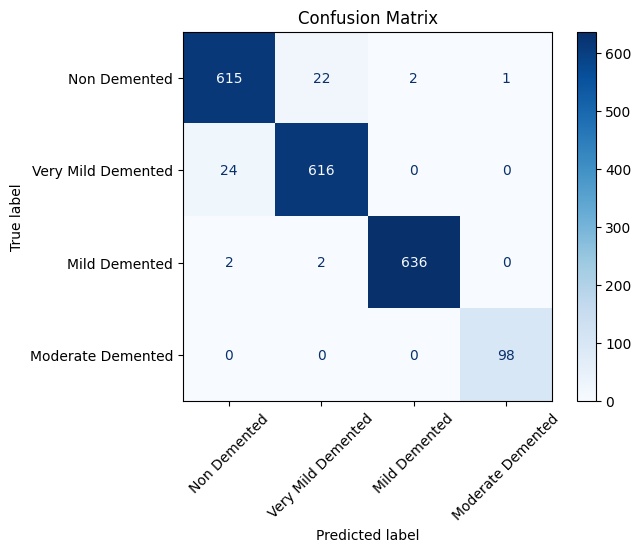

In [35]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import numpy as np

# Predict on test data
y_pred_probs = model.predict(x_test)   # probabilities
y_pred_int = np.argmax(y_pred_probs, axis=1)  # convert to class indices

# Convert ground truth from one-hot to integer
y_test_int = np.argmax(y_test, axis=1)

# Compute confusion matrix
cm = confusion_matrix(y_test_int, y_pred_int)

# Class names (adjust if order is different in your OneHotEncoder)
class_names = ["Non Demented", "Very Mild Demented", "Mild Demented", "Moderate Demented"]

# Display confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues, xticks_rotation=45)
plt.title("Confusion Matrix")
plt.show()

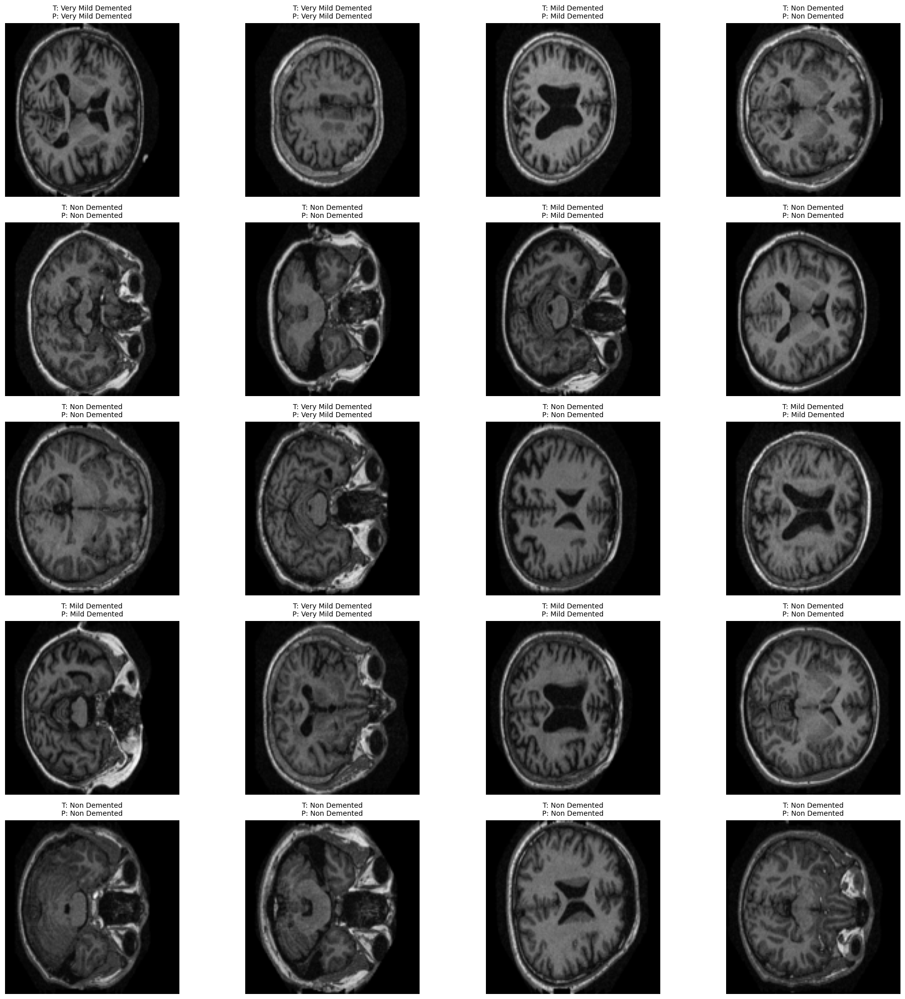

In [43]:
import random
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# Class names
class_names = ["Non Demented", "Very Mild Demented", "Mild Demented", "Moderate Demented"]

# Pick 20 random indices
random_indices = random.sample(range(len(x_test)), 20)

plt.figure(figsize=(20, 20))

for i, idx in enumerate(random_indices):
    img = x_test[idx]
    true_label = np.argmax(y_test[idx])

    # Expand dimensions for prediction
    img_input = np.expand_dims(img, axis=0)

    # Predict
    pred_probs = model.predict(img_input, verbose=0)
    pred_class = np.argmax(pred_probs)

    # Plot
    plt.subplot(5, 4, i + 1)  # 5 rows × 4 cols = 20 images
    plt.imshow(img.astype("uint8"))
    plt.axis("off")
    plt.title(f"T: {class_names[true_label]}\nP: {class_names[pred_class]}", fontsize=10)

plt.tight_layout()
plt.show()


In [59]:
import os
import pandas as pd
from tqdm import tqdm

# Path to dataset (Kaggle usually mounts input datasets under /kaggle/input/)
dataset_path = "/kaggle/input/amd-dataset/combined_images"

images = []
labels = []

# Loop through folders (class names)
for folder in tqdm(os.listdir(dataset_path)):
    folder_path = os.path.join(dataset_path, folder)
    if os.path.isdir(folder_path):  # only process directories
        for image_filename in os.listdir(folder_path):
            image_path = os.path.join(folder_path, image_filename)
            images.append(image_path)
            labels.append(folder)  # folder name as label

# Create DataFrame
df = pd.DataFrame({'image': images, 'label': labels})

# Display first 5 rows
df.head()

100%|██████████| 4/4 [00:00<00:00,  5.34it/s]


,image,label
0,/kaggle/input/amd-dataset/combined_images/Mode...,ModerateDemented
1,/kaggle/input/amd-dataset/combined_images/Mode...,ModerateDemented
2,/kaggle/input/amd-dataset/combined_images/Mode...,ModerateDemented
3,/kaggle/input/amd-dataset/combined_images/Mode...,ModerateDemented
4,/kaggle/input/amd-dataset/combined_images/Mode...,ModerateDemented


Exact counts for each class:
label
NonDemented         12800
VeryMildDemented    11200
ModerateDemented    10000
MildDemented        10000
Name: count, dtype: int64


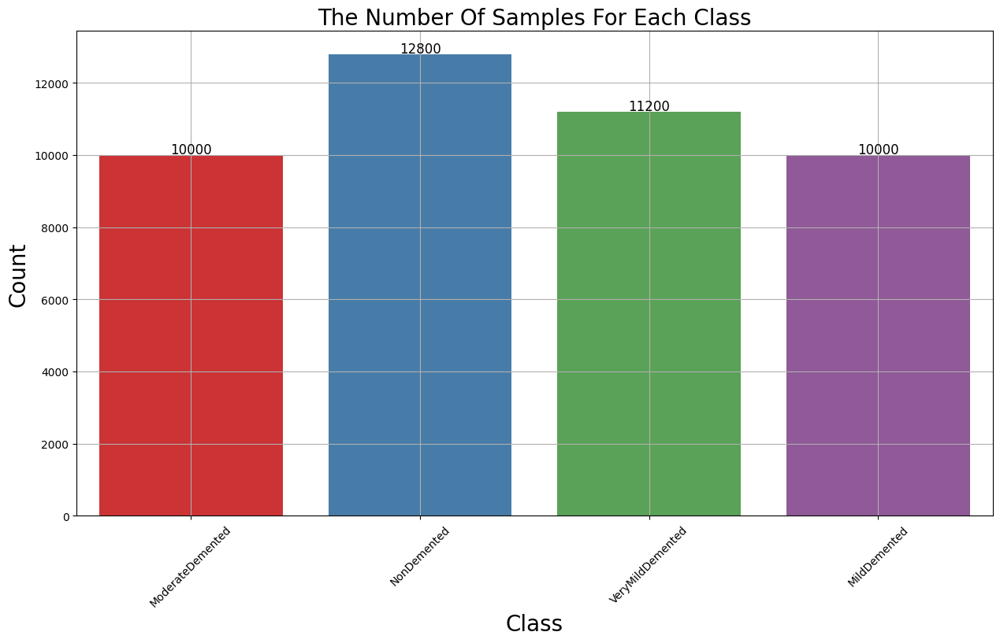

In [60]:
# Assuming `df` is your DataFrame and `label` is the column with class labels
class_counts = df['label'].value_counts()

# Print exact counts
print("Exact counts for each class:")
print(class_counts)

# Plot the class distribution
plt.figure(figsize=(15, 8))
ax = sns.countplot(x=df['label'], palette='Set1')
ax.set_xlabel("Class", fontsize=20)
ax.set_ylabel("Count", fontsize=20)
plt.title('The Number Of Samples For Each Class', fontsize=20)
plt.grid(True)
plt.xticks(rotation=45)

# Annotate each bar with the exact count
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=12, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.show()

In [61]:
X_train, X_test1, y_train, y_test1 = train_test_split(df['image'], df['label'], test_size=0.2, random_state=42,shuffle=True,stratify=df['label'])
X_val, X_test, y_val, y_test = train_test_split(X_test1,y_test1, test_size=0.5, random_state=42,shuffle=True,stratify=y_test1)
df_train = pd.DataFrame({'image': X_train, 'label': y_train})
df_test = pd.DataFrame({'image': X_test, 'label': y_test})
df_val = pd.DataFrame({'image': X_val, 'label': y_val})

In [62]:
image_size = (224,224)
batch_size = 32
datagen = ImageDataGenerator(
    preprocessing_function= tf.keras.applications.resnet.preprocess_input,
    rescale=1./255,
    horizontal_flip=True
)
train_generator = datagen.flow_from_dataframe(
    df_train,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)
test_generator = datagen.flow_from_dataframe(
    df_test,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)
val_generator = datagen.flow_from_dataframe(
    df_val,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

Found 35200 validated image filenames belonging to 4 classes.
Found 4400 validated image filenames belonging to 4 classes.
Found 4400 validated image filenames belonging to 4 classes.


In [63]:
class_num=list(train_generator.class_indices.keys())
class_num

['MildDemented', 'ModerateDemented', 'NonDemented', 'VeryMildDemented']

In [66]:
# Define CNN
cnn_model = keras.models.Sequential([
    keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(224,224,3)),
    keras.layers.MaxPooling2D((2,2)),

    keras.layers.Conv2D(64, (3,3), activation='relu'),
    keras.layers.MaxPooling2D((2,2)),

    keras.layers.Conv2D(128, (3,3), activation='relu'),
    keras.layers.MaxPooling2D((2,2)),

    keras.layers.Flatten(),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(len(class_num), activation='softmax')
])



In [68]:
from tensorflow.keras.callbacks import EarlyStopping

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,   # stop if no improvement for 3 epochs
    restore_best_weights=True
)

In [69]:
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

history_cnn = cnn_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=20,
    callbacks=[early_stop]
)

loss, acc = cnn_model.evaluate(test_generator)
print(f"CNN Test Accuracy: {acc:.4f}, Loss: {loss:.4f}")


Epoch 1/20
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 148s 131ms/step - accuracy: 0.5572 - loss: 0.9629 - val_accuracy: 0.7189 - val_loss: 0.6159
Epoch 2/20
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 83s 75ms/step - accuracy: 0.6919 - loss: 0.6709 - val_accuracy: 0.7864 - val_loss: 0.4873
Epoch 3/20
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 90s 82ms/step - accuracy: 0.7503 - loss: 0.5459 - val_accuracy: 0.8339 - val_loss: 0.3914
Epoch 4/20
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 89s 81ms/step - accuracy: 0.7844 - loss: 0.4691 - val_accuracy: 0.8507 - val_loss: 0.3638
Epoch 5/20
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 84s 76ms/step - accuracy: 0.8143 - loss: 0.4213 - val_accuracy: 0.8702 - val_loss: 0.3185
Epoch 6/20
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 82s 74ms/step - accuracy: 0.8262 - loss: 0.3911 - val_accuracy: 0.8741 - val_loss: 0.2997
Epoch 7/20
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 85s 77ms/step - accuracy: 0.8397 - loss: 0.3587 - val_accuracy: 0.8741 - val_loss: 0.3056
Epoch 8/20
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 85s 77ms/step - accuracy: 0.8479

138/138 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step


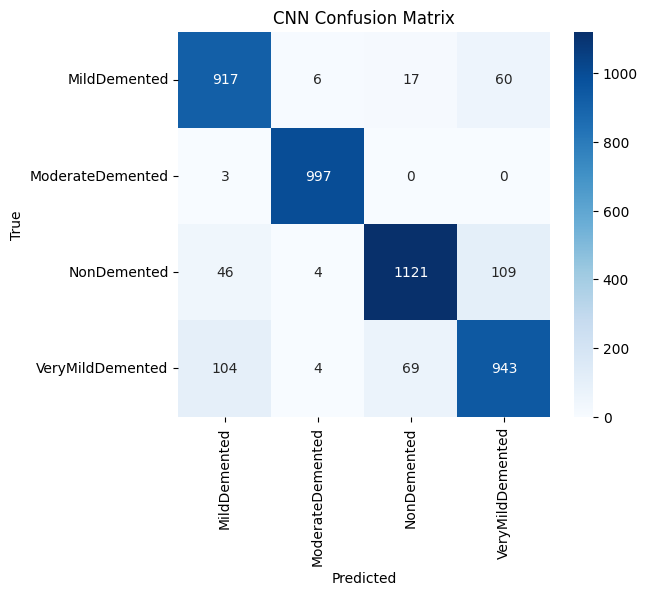

In [70]:
# Confusion Matrix
y_pred = cnn_model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_generator.classes
cm = confusion_matrix(y_true, y_pred_classes)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", xticklabels=class_num, yticklabels=class_num, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("CNN Confusion Matrix")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 673ms/step


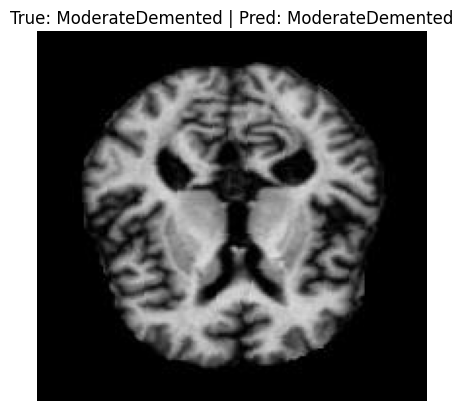

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


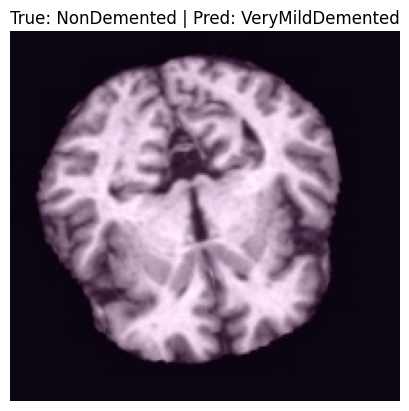

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


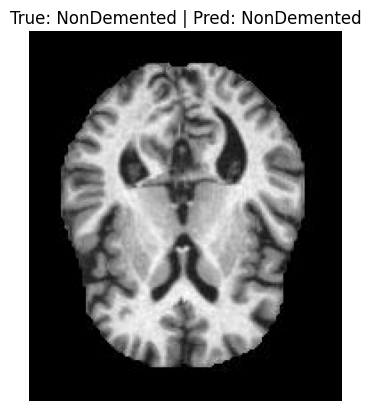

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


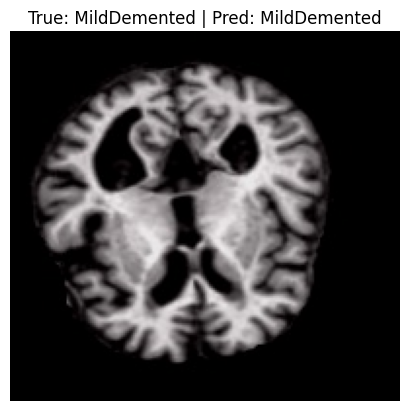

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


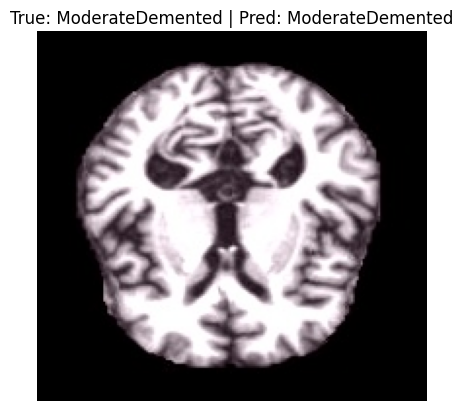

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


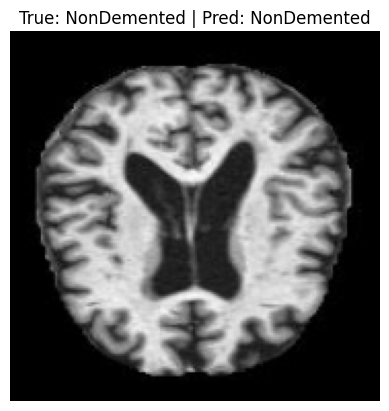

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


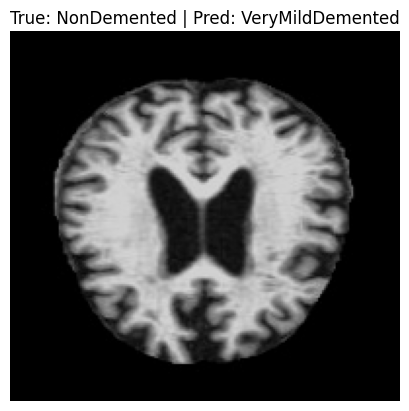

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


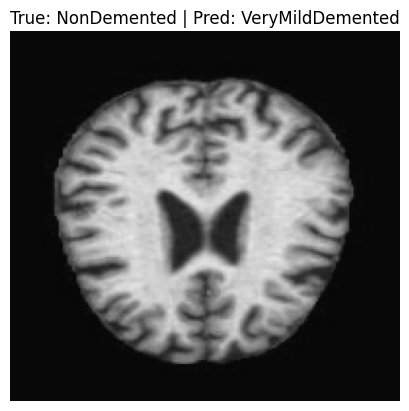

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


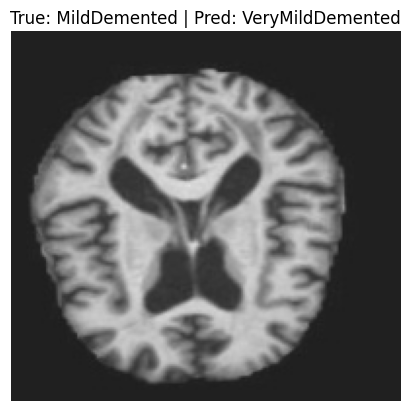

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


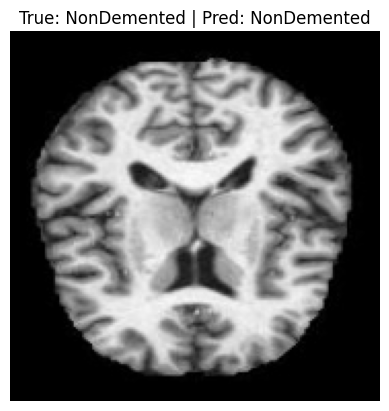

In [71]:
# Test on 10 random images
for i in range(10):
    idx = random.randint(0, len(df_test)-1)
    img_path = df_test.iloc[idx]['image']
    true_label = df_test.iloc[idx]['label']

    img = image.load_img(img_path, target_size=(224,224))
    img_array = image.img_to_array(img)/255.0
    img_array = np.expand_dims(img_array, axis=0)

    pred = cnn_model.predict(img_array)
    pred_class = class_num[np.argmax(pred)]

    plt.imshow(image.load_img(img_path))
    plt.title(f"True: {true_label} | Pred: {pred_class}")
    plt.axis("off")
    plt.show()


In [1]:
import os
import pandas as pd
from tqdm import tqdm

# Path to dataset (Kaggle usually mounts input datasets under /kaggle/input/)
dataset_path = "/kaggle/input/adni-dataset/AugmentedAlzheimerDataset"

images = []
labels = []

# Loop through folders (class names)
for folder in tqdm(os.listdir(dataset_path)):
    folder_path = os.path.join(dataset_path, folder)
    if os.path.isdir(folder_path):  # only process directories
        for image_filename in os.listdir(folder_path):
            image_path = os.path.join(folder_path, image_filename)
            images.append(image_path)
            labels.append(folder)  # folder name as label

# Create DataFrame
df = pd.DataFrame({'image': images, 'label': labels})

# Display first 5 rows
df.head()

100%|██████████| 5/5 [00:00<00:00,  5.58it/s]


,image,label
0,/kaggle/input/adni-dataset/AugmentedAlzheimerD...,.tmp.driveupload
1,/kaggle/input/adni-dataset/AugmentedAlzheimerD...,.tmp.driveupload
2,/kaggle/input/adni-dataset/AugmentedAlzheimerD...,.tmp.driveupload
3,/kaggle/input/adni-dataset/AugmentedAlzheimerD...,.tmp.driveupload
4,/kaggle/input/adni-dataset/AugmentedAlzheimerD...,.tmp.driveupload


In [7]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import keras
from keras.callbacks import EarlyStopping, ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix, classification_report
from tqdm import tqdm
# from imblearn.over_sampling import SMOTE
from sklearn.utils.multiclass import check_classification_targets


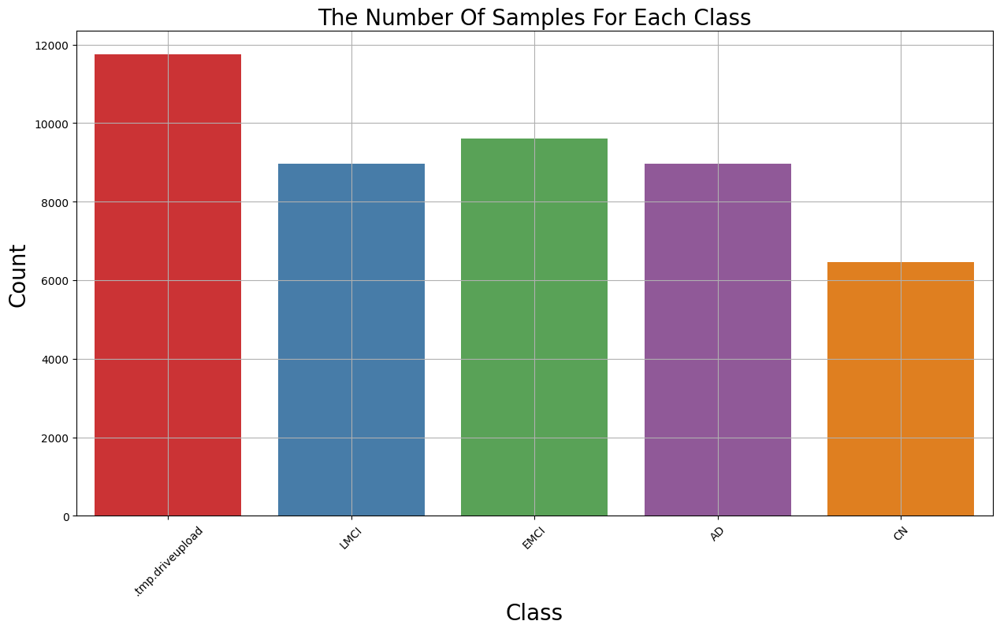

In [8]:
plt.figure(figsize=(15,8))
ax = sns.countplot(x=df.label,palette='Set1')
ax.set_xlabel("Class",fontsize=20)
ax.set_ylabel("Count",fontsize=20)
plt.title('The Number Of Samples For Each Class',fontsize=20)
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

In [9]:
X_train, X_test1, y_train, y_test1 = train_test_split(df['image'], df['label'], test_size=0.2, random_state=42,shuffle=True,stratify=df['label'])
X_val, X_test, y_val, y_test = train_test_split(X_test1,y_test1, test_size=0.5, random_state=42,shuffle=True,stratify=y_test1)
df_train = pd.DataFrame({'image': X_train, 'label': y_train})
df_test = pd.DataFrame({'image': X_test, 'label': y_test})
df_val = pd.DataFrame({'image': X_val, 'label': y_val})

In [10]:
image_size = (224,224)
batch_size = 32
datagen = ImageDataGenerator(
    preprocessing_function= tf.keras.applications.resnet.preprocess_input,
    rescale=1./255,
    horizontal_flip=True
)
train_generator = datagen.flow_from_dataframe(
    df_train,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)
test_generator = datagen.flow_from_dataframe(
    df_test,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)
val_generator = datagen.flow_from_dataframe(
    df_val,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

Found 27187 validated image filenames belonging to 4 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning: Found 9405 invalid image filename(s) in x_col="image". These filename(s) will be ignored.
  warnings.warn(


Found 3398 validated image filenames belonging to 4 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning: Found 1176 invalid image filename(s) in x_col="image". These filename(s) will be ignored.
  warnings.warn(


Found 3399 validated image filenames belonging to 4 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning: Found 1175 invalid image filename(s) in x_col="image". These filename(s) will be ignored.
  warnings.warn(


In [11]:
class_num=list(train_generator.class_indices.keys())
class_num

['AD', 'CN', 'EMCI', 'LMCI']

In [16]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import random

# -------------------------
# Build a basic CNN model
# -------------------------
cnn_model = keras.models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    layers.Flatten(),
    layers.BatchNormalization(),
    layers.Dense(512, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(4, activation='softmax')
])

cnn_model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

cnn_model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 86528)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 86528)          │       346,112 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 512)            │    44,302,848 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 44,810,948 (170.94 MB)

 Trainable params: 44,636,612 (170.28 MB)

 Non-trainable params: 174,336 (681.00 KB)

In [17]:
# -------------------------
# Callbacks
# -------------------------
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint = keras.callbacks.ModelCheckpoint("best_cnn.h5", monitor='val_accuracy', save_best_only=True)

# -------------------------
# Train the model
# -------------------------
history = cnn_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=20,
    callbacks=[early_stop, checkpoint]
)

Epoch 1/20
850/850 ━━━━━━━━━━━━━━━━━━━━ 66s 71ms/step - accuracy: 0.5299 - loss: 1.0892 - val_accuracy: 0.5175 - val_loss: 1.3864
Epoch 2/20
850/850 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - accuracy: 0.7774 - loss: 0.5319 - val_accuracy: 0.7137 - val_loss: 0.7864
Epoch 3/20
850/850 ━━━━━━━━━━━━━━━━━━━━ 62s 73ms/step - accuracy: 0.8657 - loss: 0.3328 - val_accuracy: 0.7938 - val_loss: 0.5845
Epoch 4/20
850/850 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - accuracy: 0.9092 - loss: 0.2356 - val_accuracy: 0.7717 - val_loss: 0.6844
Epoch 5/20
850/850 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - accuracy: 0.9306 - loss: 0.1825 - val_accuracy: 0.8470 - val_loss: 0.5055
Epoch 6/20
850/850 ━━━━━━━━━━━━━━━━━━━━ 60s 70ms/step - accuracy: 0.9445 - loss: 0.1550 - val_accuracy: 0.8776 - val_loss: 0.3704
Epoch 7/20
850/850 ━━━━━━━━━━━━━━━━━━━━ 61s 71ms/step - accuracy: 0.9588 - loss: 0.1158 - val_accuracy: 0.8856 - val_loss: 0.3266
Epoch 8/20
850/850 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - accuracy: 0.9402 - loss: 0.1609 - 

107/107 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step


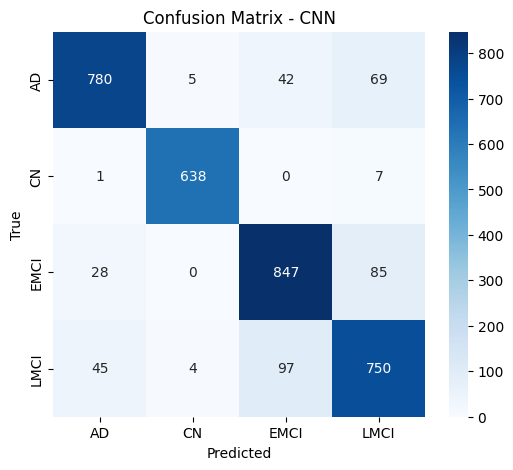

              precision    recall  f1-score   support

          AD       0.91      0.87      0.89       896
          CN       0.99      0.99      0.99       646
        EMCI       0.86      0.88      0.87       960
        LMCI       0.82      0.84      0.83       896

    accuracy                           0.89      3398
   macro avg       0.90      0.89      0.89      3398
weighted avg       0.89      0.89      0.89      3398



In [18]:
# -------------------------
# Evaluate
# -------------------------
y_true = test_generator.classes
y_pred = cnn_model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix - CNN")
plt.show()

print(classification_report(y_true, y_pred_classes, target_names=test_generator.class_indices.keys()))
 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


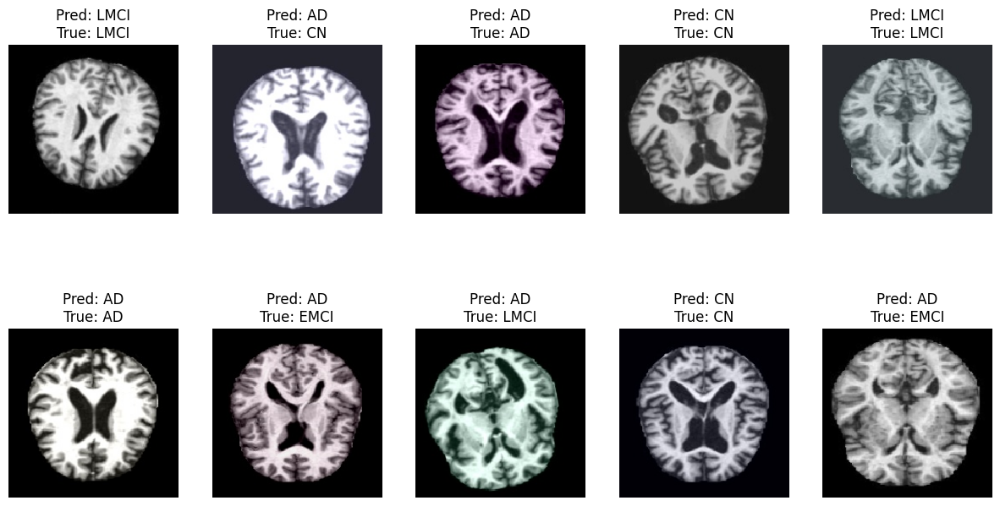

In [20]:
# -------------------------
# Predict on 10 random test images (with True & Pred labels)
# -------------------------
indices = random.sample(range(len(test_generator.filenames)), 10)
plt.figure(figsize=(15,8))

class_labels = list(test_generator.class_indices.keys())

for i, idx in enumerate(indices):
    img_path = test_generator.filepaths[idx]
    img = keras.preprocessing.image.load_img(img_path, target_size=(224,224))
    img_array = keras.preprocessing.image.img_to_array(img) / 255.0
    pred = cnn_model.predict(np.expand_dims(img_array, axis=0))
    pred_class = np.argmax(pred)

    true_class = y_true[idx]

    plt.subplot(2,5,i+1)
    plt.imshow(img)
    plt.title(f"Pred: {class_labels[pred_class]}\nTrue: {class_labels[true_class]}")
    plt.axis("off")

plt.show()